In [232]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as ex
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.offline as pyo
pyo.init_notebook_mode()
sns.set_style('darkgrid')
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import f1_score as f1
from sklearn.metrics import confusion_matrix
import scikitplot as skplt
import matplotlib_venn as venn
from math import pi
from pandas.plotting import parallel_coordinates
import plotly.graph_objs as go
import plotly as py
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import warnings
warnings.filterwarnings("ignore")

plt.rc('figure',figsize=(18,9))
from imblearn.over_sampling import SMOTE

In [233]:
data=pd.read_csv("BankChurners.csv")
data

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.999910
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.999940
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.999980
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.999870
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.999980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462,0.000191,0.999810
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,...,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,0.995270,0.004729
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,0.997880,0.002118
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,...,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,0.996710,0.003294


In [234]:
data=data.drop(columns=['Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1','Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'])
data

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,...,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,...,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


In [235]:
data.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [236]:
data.tail()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,...,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,...,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000
10126,714337233,Attrited Customer,43,F,2,Graduate,Married,Less than $40K,Silver,25,...,2,4,10388.0,1961,8427.0,0.703,10294,61,0.649,0.189


In [237]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.0,7.391776e+08,3.690378e+07,708082083.0,7.130368e+08,7.179264e+08,7.731435e+08,8.283431e+08
Customer_Age,10127.0,4.632596e+01,8.016814e+00,26.0,4.100000e+01,4.600000e+01,5.200000e+01,7.300000e+01
Dependent_count,10127.0,2.346203e+00,1.298908e+00,0.0,1.000000e+00,2.000000e+00,3.000000e+00,5.000000e+00
Months_on_book,10127.0,3.592841e+01,7.986416e+00,13.0,3.100000e+01,3.600000e+01,4.000000e+01,5.600000e+01
Total_Relationship_Count,10127.0,3.812580e+00,1.554408e+00,1.0,3.000000e+00,4.000000e+00,5.000000e+00,6.000000e+00
Months_Inactive_12_mon,10127.0,2.341167e+00,1.010622e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Contacts_Count_12_mon,10127.0,2.455317e+00,1.106225e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Credit_Limit,10127.0,8.631954e+03,9.088777e+03,1438.3,2.555000e+03,4.549000e+03,1.106750e+04,3.451600e+04
Total_Revolving_Bal,10127.0,1.162814e+03,8.149873e+02,0.0,3.590000e+02,1.276000e+03,1.784000e+03,2.517000e+03
Avg_Open_To_Buy,10127.0,7.469140e+03,9.090685e+03,3.0,1.324500e+03,3.474000e+03,9.859000e+03,3.451600e+04


In [238]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           10127 non-null  object 
 6   Marital_Status            10127 non-null  object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [239]:
data['Attrition_Flag'].value_counts()

Existing Customer    8500
Attrited Customer    1627
Name: Attrition_Flag, dtype: int64

In [240]:
#percentage of customers who churned (disconnected their relationship from the bank)
print(1627/(1627+8500)*100)

16.065962279055988


In [241]:
data.shape

(10127, 21)

1) DATA GATHERING; 
2) DATA UNDERSTANDING; 
3) DATA ANALYSIS; 
4) DATA PRESENTATION

In [242]:
data.columns

Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

## CUSTOMER SEGMENTATION USING KMEANS

In [243]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

cols = data.iloc[:, 9:].select_dtypes(['uint8', 'int64', 'float64']).columns

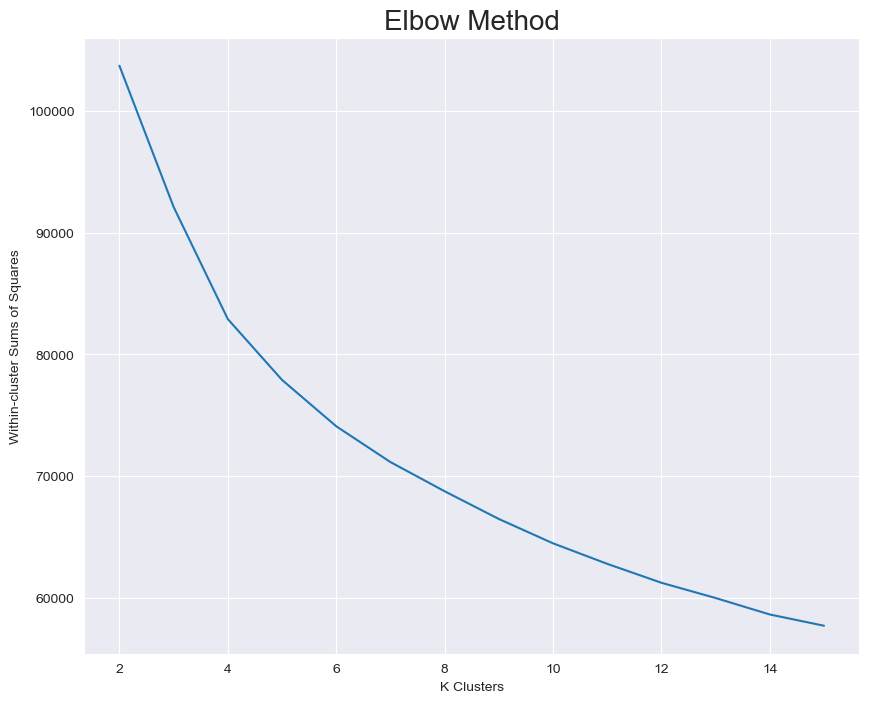

In [244]:
wcss = []

for i in range(2,16):
    km = KMeans(n_clusters=i, init='k-means++', max_iter=500, n_init=10, random_state=1)
    d = StandardScaler().fit_transform(data[cols])
    km.fit(d)
    wcss.append(km.inertia_)

fig = plt.figure(figsize=(10,8))
ax = sns.lineplot(x=range(2,16), y=wcss)
ax.set_title('Elbow Method')
ax.title.set_size(20)
plt.xlabel('K Clusters')
plt.ylabel('Within-cluster Sums of Squares')
plt.show()

In [245]:
new_data=data[cols].dropna()
scaler = StandardScaler()
scaled_data = scaler.fit_transform(new_data)
k=6
kmeans = KMeans(n_clusters=k, random_state=1)
cluster_labels = kmeans.fit_predict(scaled_data)
silhouette_avg = silhouette_score(scaled_data, cluster_labels)
print("Silhouette Score:", silhouette_avg)

Silhouette Score: 0.13579879293950167


Unfortunately, the curve didn't flatten in an obvious way, which is often the case when dealing with groups that are not well-separated. With this in mind we'll go ahead and use the curve as a rough estimate for K.

It looks like the optimal number of clusters is somewhere between 4 and 6. After trying each number, 6 clusters returned the highest Silhouette Score, so I decided to proceed with 6 clusters. The Silhoutte score is a measure of how well defined clusters are, with scores near 1 indicating well-defined clusters, and scores near 0 indicating overlapping clusters.

Now let's create a pipeline that will first process our data and then create a KMeans model.

For preprocessing, we will first normalize our data, and then perform Principal Component Analysis.

Principal Component Analysis, or PCA, is a method that compresses the information found in the explanatory variables into a reduced number of new variables. This reduces the noise and dimensionality of the data while preserving most of the original information.

In [246]:
preprocessor = Pipeline(
[("scaler", StandardScaler()),
 ("pca", PCA(n_components=2, random_state=1))]
)

clusterer = Pipeline([("kmeans",KMeans(n_clusters=6,
                       init="k-means++",
                       n_init=50,
                       max_iter=1000,
                                       random_state=1))])
pipe = Pipeline(
        [("preprocessor", preprocessor),
         ("clusterer", clusterer)])
pipe.fit(data[cols])

Pipeline(steps=[('preprocessor',
                 Pipeline(steps=[('scaler', StandardScaler()),
                                 ('pca',
                                  PCA(n_components=2, random_state=1))])),
                ('clusterer',
                 Pipeline(steps=[('kmeans',
                                  KMeans(max_iter=1000, n_clusters=6, n_init=50,
                                         random_state=1))]))])

In [247]:
print('PCA Component 1 Ratio of Explained Variance')
print(round(preprocessor['pca'].explained_variance_ratio_[0], 2))
print()
print('PCA Component 2 Ratio of Explained Variance')
print(round(preprocessor['pca'].explained_variance_ratio_[1], 2))

PCA Component 1 Ratio of Explained Variance
0.21

PCA Component 2 Ratio of Explained Variance
0.17


It looks like we were able to create and fit our model, with our 2 components from PCA explaining about 38% of the variance.

Now let's add the cluster labels to our data and see how well our clusters are defined.

In [248]:
preprocessed_data = pipe["preprocessor"].transform(data[cols])

predicted_labels = pipe["clusterer"]["kmeans"].labels_

print('Silhouette Score: ', round(silhouette_score(preprocessed_data, predicted_labels), 3))

Silhouette Score:  0.395


While ideally the Silhouette score would be higher, given the somewhat non-distinct groups in the data we're using we will consider this as an acceptable score.

Let's take a look at the clusters on a scatterplot.

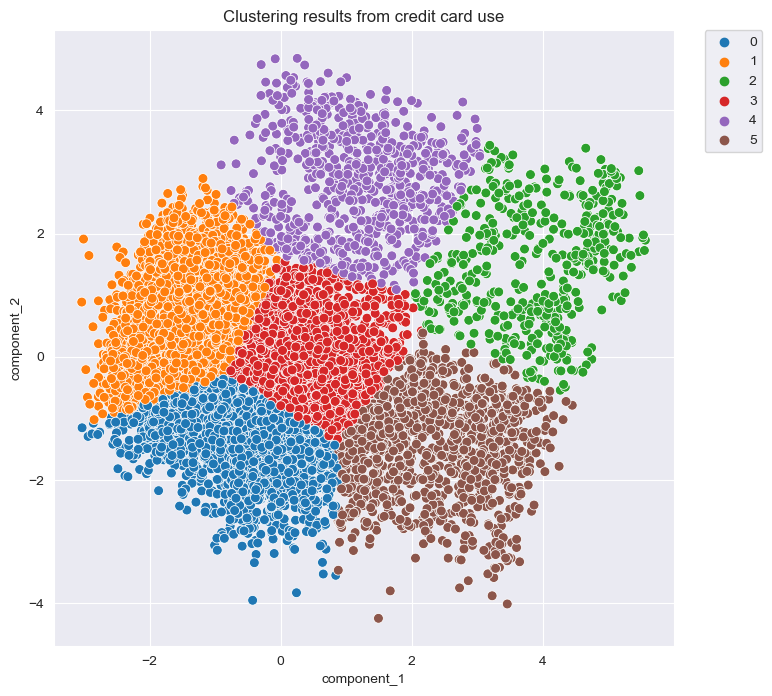

In [249]:

pcadf = pd.DataFrame(
        pipe["preprocessor"].transform(data[cols]),
        columns=["component_1", "component_2"]
    )
   
pcadf["predicted_cluster"] = pipe["clusterer"]["kmeans"].labels_

plt.figure(figsize=(8, 8))
   
sp = sns.scatterplot(
        x="component_1",
        y="component_2",
        s=50,
        data=pcadf,
        hue="predicted_cluster",
        palette='tab10'
    )
   
sp.set_title("Clustering results from credit card use")
ax.title.set_size(20)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
   
plt.show()

As we saw from the Silhouette score, there is clearly some overlap between clusters, but overall there appears to be several distinct clusters in the data.

Let's look at how many people are in each cluster next.

In [250]:

data['cluster'] = pipe['clusterer']['kmeans'].labels_
data.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,cluster
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,3
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,1
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,1
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,1
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,1


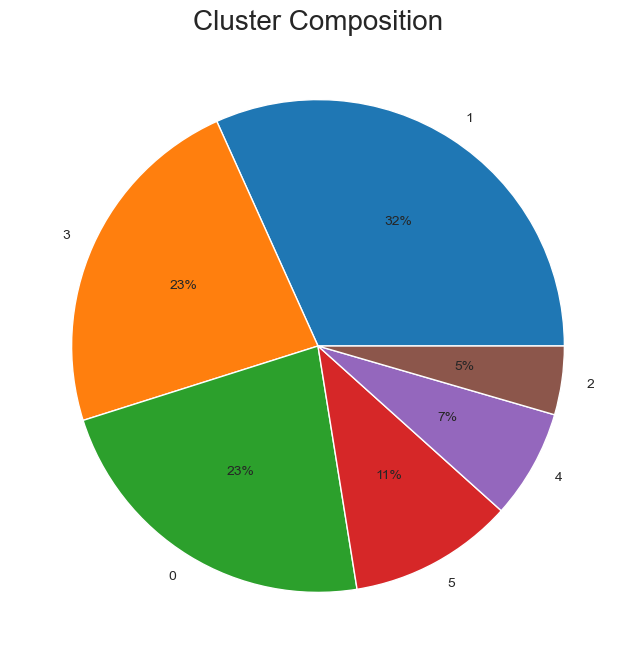

In [251]:

fig, axs = plt.subplots(figsize=(12,8))
ax = data['cluster'].value_counts().plot.pie(autopct='%1.0f%%')
ax.set_ylabel('')
ax.set_title('Cluster Composition')
ax.title.set_size(20)
plt.show()

Most users fall into either Group 1, 2, or 4, with most of the rest being in Groups 0 and 3.

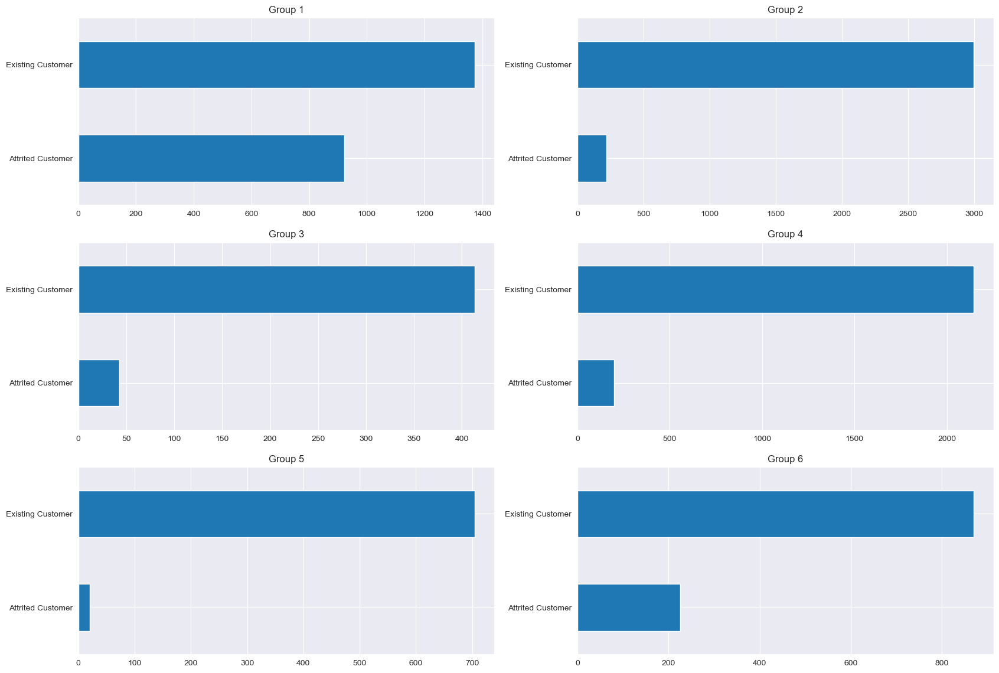

In [252]:
fig, axs = plt.subplots(ncols=2,nrows=3, figsize=(20,14))

data[data['cluster'] == 0]['Attrition_Flag'].value_counts().sort_index().plot.barh(ax=axs[0,0], title='Group 1')
data[data['cluster'] == 1]['Attrition_Flag'].value_counts().sort_index().plot.barh(ax=axs[0,1], title='Group 2')
data[data['cluster'] == 2]['Attrition_Flag'].value_counts().sort_index().plot.barh(ax=axs[1,0], title='Group 3')
data[data['cluster'] == 3]['Attrition_Flag'].value_counts().sort_index().plot.barh(ax=axs[1,1], title='Group 4')
data[data['cluster'] == 4]['Attrition_Flag'].value_counts().sort_index().plot.barh(ax=axs[2,0], title='Group 5')
data[data['cluster'] == 5]['Attrition_Flag'].value_counts().sort_index().plot.barh(ax=axs[2,1], title='Group 6')
plt.show()

In [253]:

scaler = StandardScaler()
scaled_cc = pd.DataFrame(scaler.fit_transform(data[cols]), columns=cols)
scaled_cc['cluster'] = pipe['clusterer']['kmeans'].labels_
scaled_cc.head()

,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,cluster
0,0.384621,0.763943,-1.327136,0.492404,0.446622,-0.473422,0.488971,2.623494,-0.959707,-0.973895,3.834003,-0.775882,3
1,1.010715,1.407306,-1.327136,-0.411616,-0.041367,-0.366667,-0.008486,3.563293,-0.916433,-1.357340,12.608573,-0.616276,1
2,0.008965,0.120579,-1.327136,-2.219655,-0.573698,-1.426858,-0.445658,8.367214,-0.740982,-1.911206,6.807864,-0.997155,1
3,-0.241473,-0.522785,1.641478,-1.315636,-0.585251,1.661686,-0.734100,2.942843,-0.951758,-1.911206,6.807864,1.759686,1
4,-1.869317,0.763943,-1.327136,-2.219655,-0.430877,-1.426858,-0.302868,6.455682,-1.056263,-1.570365,7.509325,-0.997155,1


In [254]:
data["cluster"].unique()

array([3, 1, 0, 5, 4, 2])

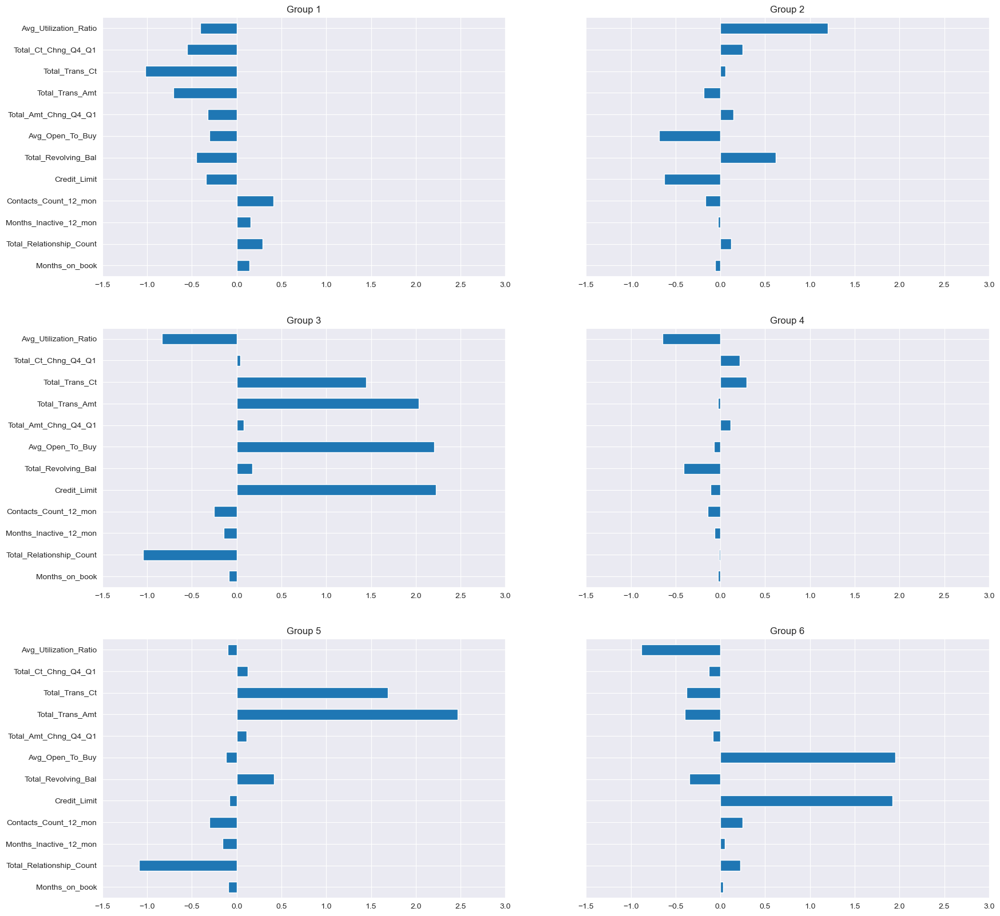

In [255]:

fix, axs = plt.subplots(ncols=2,nrows=3, figsize=(20,32))

scaled_cc[scaled_cc['cluster'] == 0][cols].mean().plot.barh(ax=axs[0,0], xlim=(-1.5, 3), figsize=(20,20), sharey=True, title='Group 1')
scaled_cc[scaled_cc['cluster'] == 1][cols].mean().plot.barh(ax=axs[0,1], xlim=(-1.5, 3), figsize=(20,20), sharey=True, title='Group 2')
scaled_cc[scaled_cc['cluster'] == 2][cols].mean().plot.barh(ax=axs[1,0], xlim=(-1.5, 3), figsize=(20,20), sharey=True, title='Group 3')
scaled_cc[scaled_cc['cluster'] == 3][cols].mean().plot.barh(ax=axs[1,1], xlim=(-1.5, 3), figsize=(20,20), sharey=True, title='Group 4')
scaled_cc[scaled_cc['cluster'] == 4][cols].mean().plot.barh(ax=axs[2,0], xlim=(-1.5, 3), figsize=(20,20), sharey=True, title='Group 5')
scaled_cc[scaled_cc['cluster'] == 5][cols].mean().plot.barh(ax=axs[2,1], xlim=(-1.5, 3), figsize=(20,20), sharey=True, title='Group 6')
plt.show()

Looking at the charts above, we can see the groups have the following characteristics:

Group 1: High transaction count and amount, higher balance, low relationship count, lower contact count Group 2: Low transaction count and amount, lower count and amount change from Q4 to Q1, high contact count, higher relationship count, higher months on book, higher months inactive, lower balance Group 3: High utilization ratio, higher count and amount change from Q4 to Q1, low avg open to buy, higher balance, low credit limit Group 4: Low transaction count and amount, low utilization ratio, lower count and amount change from Q4 to Q1, high contact count, higher relationship count, lower balance Group 5: Lower utilization ratio, higher transaction count, higher transaction count change from Q1 to Q4, low balance Group 6: High transaction count and amount, high avg open to buy, high credit limit, low relationship count, low utilization ratio Based on the results above, I decided to give the following names to each of the groups:

Group 1: Higher balance heavy users

Group 2: Long-time very light users

Group 3: Low limit, high balance light users

Group 4: High limit, low balance light users

Group 5: Low limit, low balance light users

Group 6: High limit, low balance heavy users

## EXPLORATORY DATA ANALYSIS (EDA)

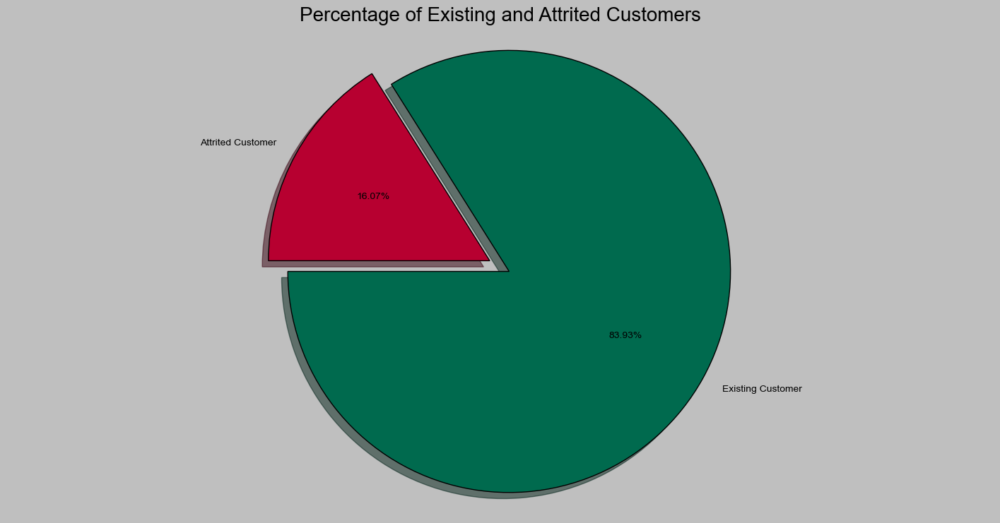

In [256]:
with plt.style.context('grayscale'): # seaborn-deep
    plt.pie([
        data.Attrition_Flag[data.Attrition_Flag == 'Existing Customer'].count(),
        data.Attrition_Flag[data.Attrition_Flag == 'Attrited Customer'].count()
    ],
            labels=['Existing Customer', 'Attrited Customer'],
            colors=['#006a4e', '#b70030'],
            explode=[0.1, 0],
            autopct='%1.2f%%',
            shadow=True,
            startangle=180)
    plt.title("Percentage of Existing and Attrited Customers", size=20)
    plt.axis('equal')
    plt.show()

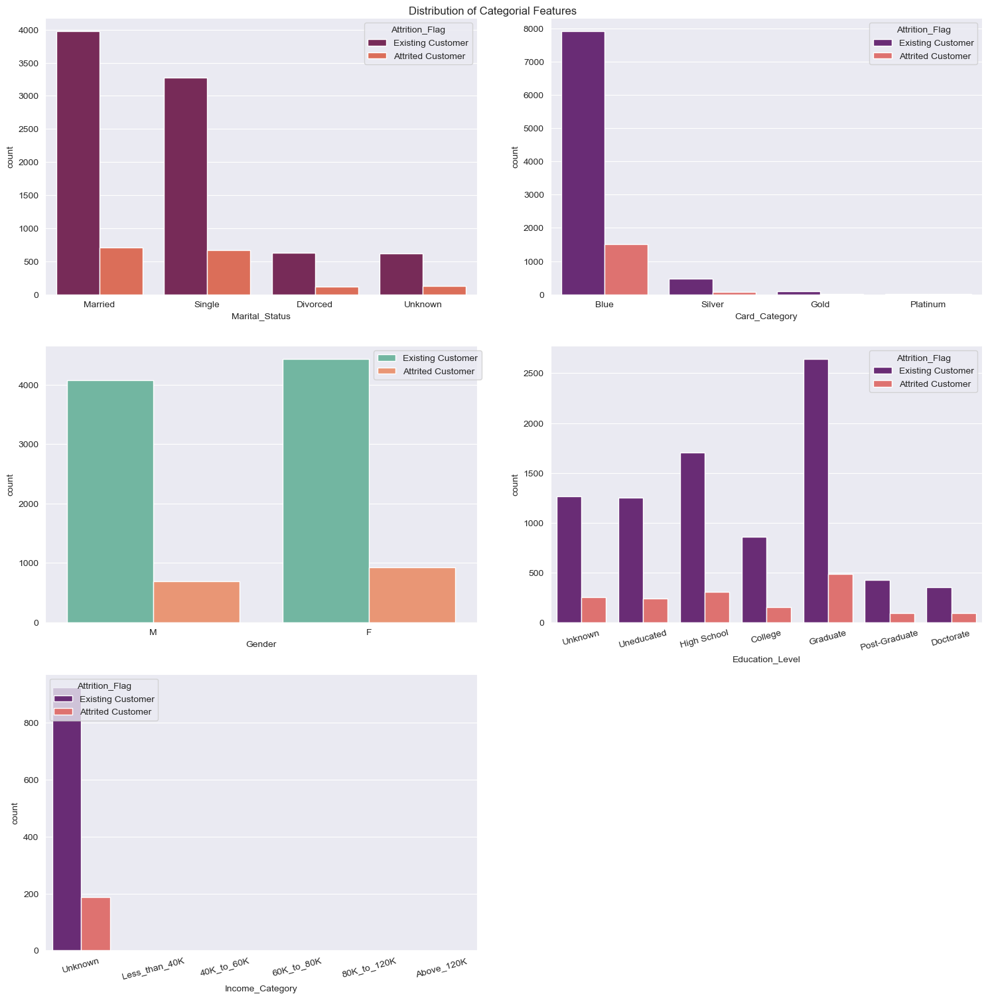

In [257]:
plt.figure(figsize=(15, 15))
plt.subplot(3, 2, 1)
sns.countplot(x=data['Marital_Status'],
              hue=data['Attrition_Flag'],
              palette='rocket',
              order=['Married', 'Single', 'Divorced', 'Unknown'])
plt.subplot(3, 2, 2)
sns.countplot(x=data['Card_Category'],
              hue=data['Attrition_Flag'],
              palette='magma',
              order=['Blue', 'Silver', 'Gold', 'Platinum'])
plt.subplot(3, 2, 3)
sns.countplot(x=data['Gender'], hue=data['Attrition_Flag'], palette='Set2')
plt.legend(bbox_to_anchor=(.75, 1))
plt.subplot(3, 2, 4)
sns.countplot(x=data['Education_Level'],
              hue=data['Attrition_Flag'],
              palette='magma',
              order=[
                  'Unknown', 'Uneducated', 'High School', 'College',
                  'Graduate', 'Post-Graduate', 'Doctorate'
              ])
plt.xticks(rotation=15)
plt.subplot(3, 2, 5)
sns.countplot(x=data['Income_Category'],
              hue=data['Attrition_Flag'],
              palette='magma',
              order=[
                  'Unknown', 'Less_than_40K', '40K_to_60K', '60K_to_80K',
                  '80K_to_120K', 'Above_120K'
              ])
plt.xticks(rotation=15)
plt.tight_layout()
plt.suptitle(f'Distribution of Categorial Features \n', va='bottom')
plt.show()


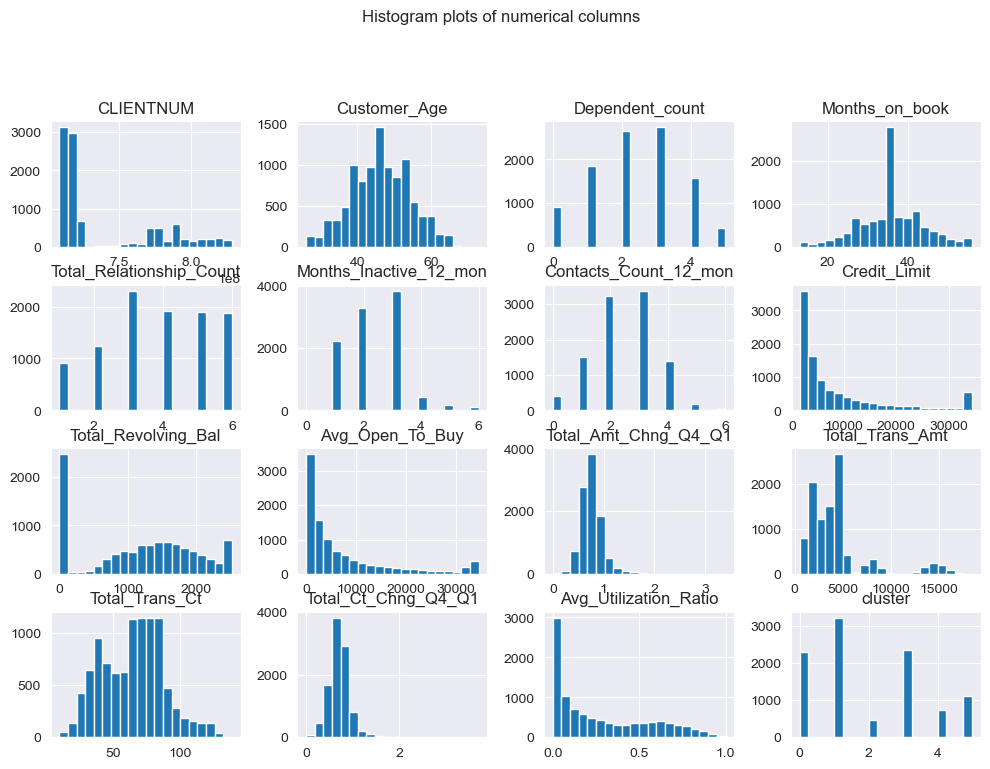

In [258]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
numerical_columns = data.select_dtypes(include='number')

# Plotting histogram for each numerical column
numerical_columns.hist(bins=20, figsize=(12, 8))
plt.suptitle('Histogram plots of numerical columns', y=1.02)
plt.show()


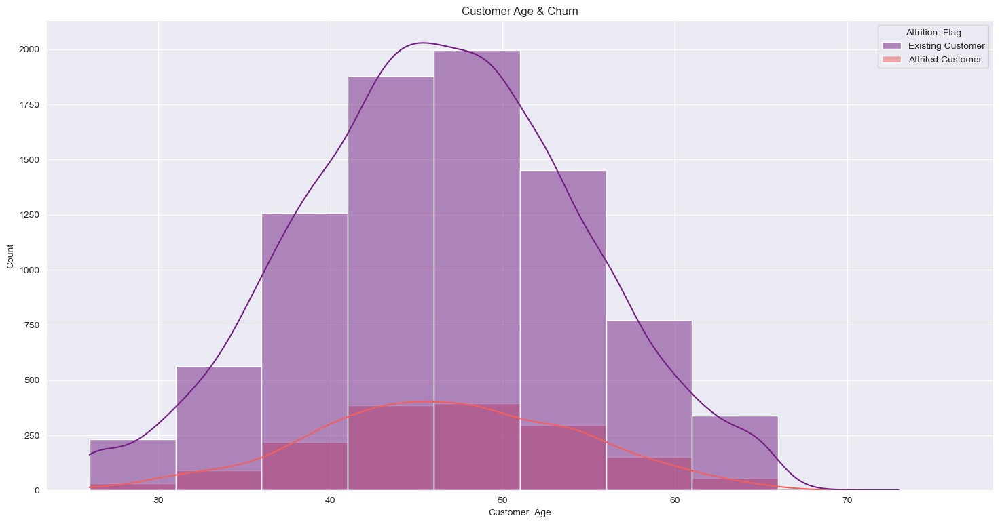

In [259]:
sns.histplot(x=data.Customer_Age,
             hue=data.Attrition_Flag,
             kde=True,
             binwidth=5,
             palette='magma')
plt.title('Customer Age & Churn')
plt.show()

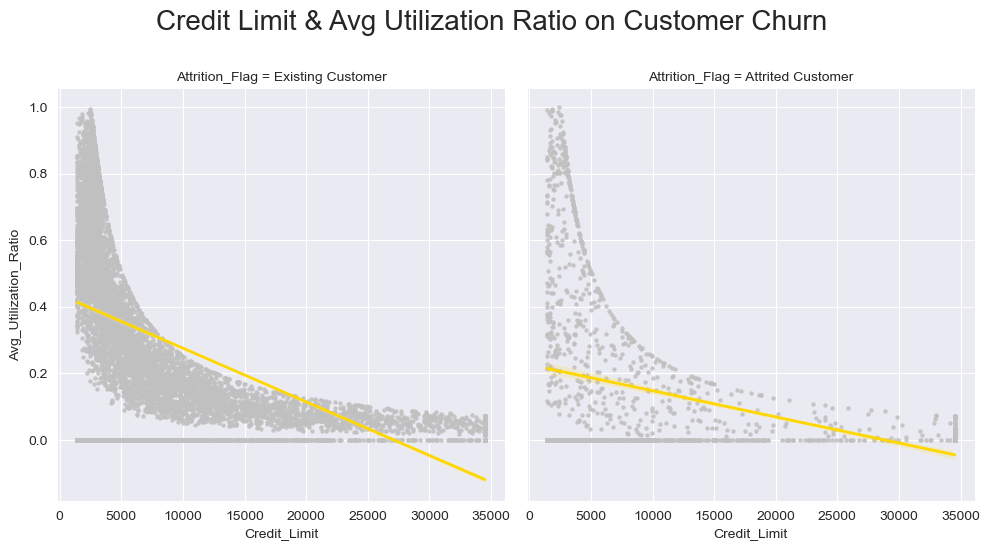

In [260]:
sns.lmplot(x='Credit_Limit',
           y='Avg_Utilization_Ratio',
           data=data,
           col='Attrition_Flag',
           palette='Set2',
           scatter_kws={
               "s": 5,
               "color": 'silver'
           },
           line_kws={
               'lw': 2,
               'color': 'gold'
           })
plt.suptitle('Credit Limit & Avg Utilization Ratio on Customer Churn \n',
             va='bottom',
             fontsize=20)
plt.show()

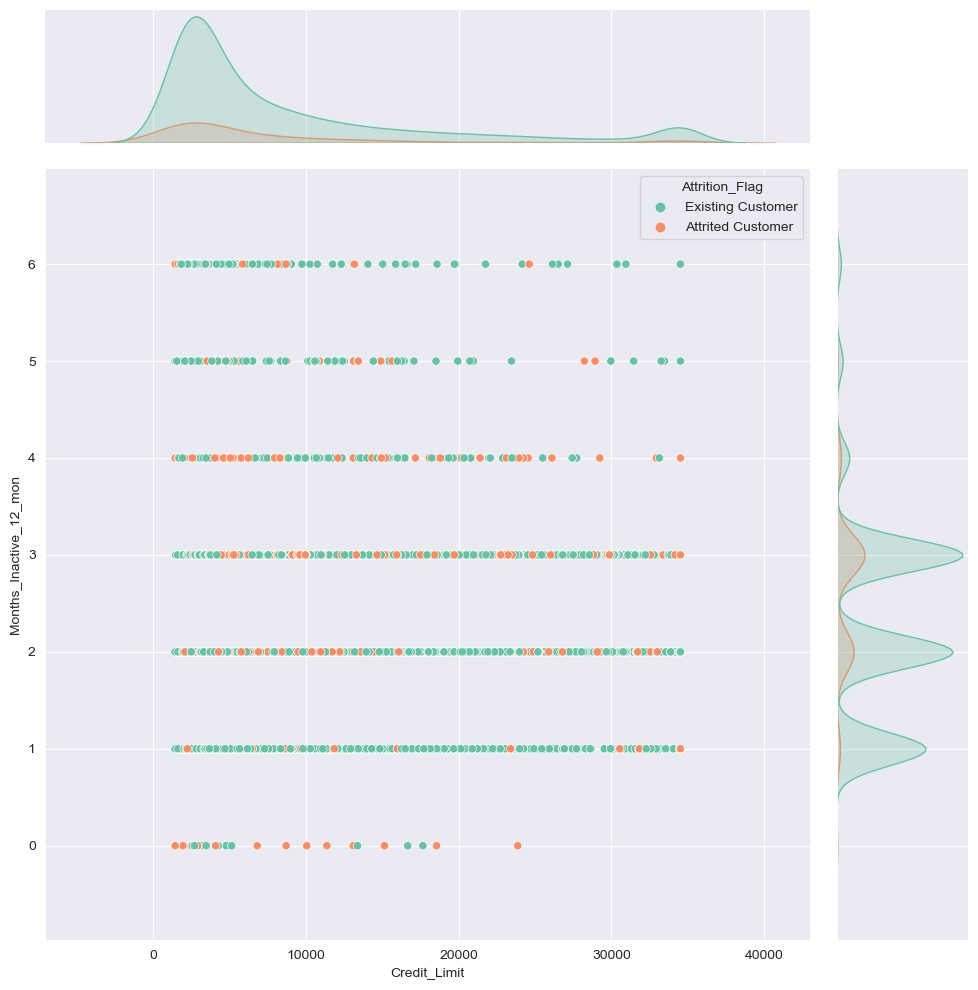

In [261]:
sns.jointplot(data=data,
              x='Credit_Limit',
              y='Months_Inactive_12_mon',
              hue='Attrition_Flag',
              palette='Set2',
              height=10)
plt.show()

In [262]:
fig=make_subplots(rows=2,cols=1)

tr1=go.Box(x=data['Customer_Age'],name='Age Box Plot',boxmean=True)
tr2=go.Histogram(x=data['Customer_Age'],name='Age Histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700,width=1200,title_text='Distribution of Customer Ages')
fig.show()

// we can see that the distribution of customer ages in our dataset follows a fairly normal distribution thus, further use of the age feature can be done with normality assumption. //

In [263]:
fig = make_subplots(
    rows=2,
    cols=2,
    subplot_titles=("", "<b>Platinum card holders</b>", "<b>Blue card holders</b>", "Residuals"),
    vertical_spacing=0.09,
    specs=[[{"type": "pie", "rowspan": 2}, {"type": "pie"}], [None, {"type": "pie"}]]
)
fig.add_trace(go.Pie(values=data.Gender.value_counts().values, labels=['<b>Female</b>', '<b>Male</b>'], hole=0, pull=[0, 0, 0]), row=1, col=1)
fig.add_trace(go.Pie(labels=['Female Platinum card holders','Male Platinum card holders'],values=data.query('Card_Category=="Platinum"').Gender.value_counts().values,pull=[0,0.05,0.5],hole=0.3),row=1,col=2)
fig.add_trace(go.Pie(labels=['Female Blue card holders','Male Blue card holders'],values=data.query('Card_Category=="Blue"').Gender.value_counts().values,pull=[0,0.2,0.5],hole=0.3),row=2,col=2)
fig.update_layout(height=800,showlegend=True,title_text="<b>Distribution of Gender and Different Card statuses<b>")
fig.show()

// more sample of females in our dataset are compared to males, but the percentage difference is not that significant, so we can say that genders are uniformly distributed. //

In [264]:
fig=make_subplots(rows=2,cols=1)

tr1=go.Box(x=data['Dependent_count'],name='Dependent count box plot',boxmean=True)
tr2=go.Histogram(x=data['Dependent_count'],name='Dependent count histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700,width=1200,title_text='Distribution of dependent counts(close family size)')
fig.show()

// the distributuion of dependent counts is fairly normally distributed with a slight right skew. //

In [265]:
ex.pie(data,names='Education_Level',title='Proportion of education levels',hole=0.33)

// if most of the customers with unknown education status lack any education, we can state that more than 70% of the customers have a formal education level. About 35% have a higher level of education. //

In [266]:
ex.pie(data,names='Marital_Status',title='Proportion of different marriage statuses',hole=0.33)

// Almost half of the bank customers are married, and interestingly enough, almost the entire other half are single customers. Only about 7% of the customers are divorced, which is surprisingly considering the worldwide divorce rate statistics! //

In [267]:
ex.pie(data,names='Income_Category',title='Proportion of different income levels',hole=0.33)

In [268]:
ex.pie(data,names='Card_Category',title='Proportion of different card categories',hole=0.33)

In [269]:
fig=make_subplots(rows=2,cols=1)

tr1=go.Box(x=data["Months_on_book"],name='months on book box plot',boxmean=True)
tr2=go.Histogram(x=data['Months_on_book'],name='Months on book histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700,width=1200,title_text='Distribution of months the customer is part of the bank')
fig.show()

In [270]:
print('Kurtosis of Months on book feature is:{}'.format(data['Months_on_book'].kurt()))

Kurtosis of Months on book feature is:0.40010012019986707


// we have a low kurtosis value pointing to a very flat shaped distribution (as shown in the plot above as well) meaning we cannot assume normality of the feature. //

In [271]:
fig=make_subplots(rows=2,cols=1)

tr1=go.Box(x=data['Total_Relationship_Count'],name='Total no. of products Box plot',boxmean=True)
tr2=go.Histogram(x=data['Total_Relationship_Count'],name='Total no. of products histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700,width=1200,title_text='Distribution of total no. of products held by the customer')
fig.show()

// the distribution of the total number of products held by the customer seems closer to a uniform distribution and may appear useless as a predictor for churn status. //

In [272]:
fig=make_subplots(rows=2,cols=1)

tr1=go.Box(x=data['Months_Inactive_12_mon'],name='No. of months inactive Box plot',boxmean=True)
tr2=go.Histogram(x=data['Months_Inactive_12_mon'],name='No. of months inactive histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700,width=1200,title_text='Distribution of no. of months inactive in the last 12 months')
fig.show()

In [273]:
fig=make_subplots(rows=2,cols=1)

tr1=go.Box(x=data['Credit_Limit'],name='Credit Card Limit Box plot',boxmean=True)
tr2=go.Histogram(x=data['Credit_Limit'],name='Credit Card Limit histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700,width=1200,title_text='Distribution of Credit Card Limit')
fig.show()

In [274]:
fig=make_subplots(rows=2,cols=1)

tr1=go.Box(x=data['Total_Trans_Amt'],name='Total_Trans_Amt Box plot',boxmean=True)
tr2=go.Histogram(x=data['Total_Trans_Amt'],name='Total_Trans_Amt histogram')

fig.add_trace(tr1,row=1,col=1)
fig.add_trace(tr2,row=2,col=1)

fig.update_layout(height=700,width=1200,title_text='Distribution of Total_Trans_Amt')
fig.show()

// we see that the distribution of the total transactions (last 12 months) displays a multimodal distribution, meaning we have some underlying groups in our data; it can be interesting experiment to try and cluster the different groups and view the similarities between them and what describes best the different groups which create the different modes in our distribution. //

In [275]:
ex.pie(data,names='Attrition_Flag',title='Proportion of churn vs not churn customers',hole=0.33)

// As we can see only 16% of the data sample represents churn customers, in the following steps, we will use SMOTE to upsample the churn samples to match them with the regular customer sample size to give the later selected models a better chance of catching on small details which will almost definitely be missed out with such a size difference. //

## DATA PREPROCESSING

In [276]:
data.Attrition_Flag=data.Attrition_Flag.replace({'Attrited Customer':1,'Existing Customer':0})
data.Gender=data.Gender.replace({'F':1,'M':0})
data=pd.concat([data,pd.get_dummies(data['Education_Level']).drop(columns=['Unknown'])],axis=1)
data=pd.concat([data,pd.get_dummies(data['Income_Category']).drop(columns=['Unknown'])],axis=1)
data=pd.concat([data,pd.get_dummies(data['Marital_Status']).drop(columns=['Unknown'])],axis=1)
data=pd.concat([data,pd.get_dummies(data['Card_Category']).drop(columns=['Platinum'])],axis=1)
data.drop(columns=['Education_Level','Income_Category','Marital_Status','Card_Category','CLIENTNUM'],inplace=True)

here we one hot encode all the categorical features describing different statuses of a customer.

PEARSON PRODUCT MOMENT CORRELATION
SPEARMAN RANK-ORDER CORRELATION

In [277]:
fig=make_subplots(rows=2,cols=1,shared_xaxes=True,subplot_titles=('Pearson Correlation','Spearman Correlation'))
colorscale=[[1.0,'rgb(165,0,38)'],
           [0.8888888888888888,'rgb(215,48,39)'],
           [0.7777777777777778,'rgb(244,109,67)'],
           [0.6666666666666666,'rgb(253,174,97)'],
           [0.5555555555555555,'rgb(254,224,144)'],
           [0.4444444444444444,'rgb(224,243,248)'],
           [0.3333333333333333,'rgb(171,217,233)'],
           [0.2222222222222222,'rgb(116,173,209)'],
           [0.1111111111111111,'rgb(69,117,180)'],
           [0.0,'rgb(49,54,149)']]
s_val=data.corr('pearson')
s_idx=s_val.index
s_col=s_val.columns
s_val=s_val.values
fig.add_trace(go.Heatmap(x=s_col,y=s_idx,z=s_val,name='pearson',showscale=False,xgap=0.7,ygap=0.7,colorscale=colorscale),row=1,col=1)

s_val=data.corr('spearman')
s_idx=s_val.index
s_col=s_val.columns
s_val=s_val.values
fig.add_trace(go.Heatmap(x=s_col,y=s_idx,z=s_val,name='spearman',xgap=0.7,ygap=0.7,colorscale=colorscale),row=2,col=1)
fig.update_layout(hoverlabel=dict(bgcolor='white',font_size=16,font_family='Rockwell'))
fig.update_layout(height=700,width=900,title_text='numeric correlation')
fig.show()

## DATA UNSAMPLING USING SMOTE

## SMOTE: Synthetic Minority Oversampling Technique
SMOTE is an oversampling technique where the synthetic samples are generated for the minority class. This algorithm helps to overcome the overfitting problem posed by random oversampling. It focuses on the feature space to generate new instances with the help of interpolation between the positive instances that lie together.

In [278]:
oversample=SMOTE()
X,Y=oversample.fit_resample(data[data.columns[1:]],data[data.columns[0]])
unsampled_df=X.assign(Churn=Y)

In [279]:
unsampled_df

,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,...,$60K - $80K,$80K - $120K,Less than $40K,Divorced,Married,Single,Blue,Gold,Silver,Churn
0,45,0,3,39,5,1,3,12691.000000,777,11914.000000,...,1,0,0,0,1,0,1,0,0,0
1,49,1,5,44,6,1,2,8256.000000,864,7392.000000,...,0,0,1,0,0,1,1,0,0,0
2,51,0,3,36,4,1,0,3418.000000,0,3418.000000,...,0,1,0,0,1,0,1,0,0,0
3,40,1,4,34,3,4,1,3313.000000,2517,796.000000,...,0,0,1,0,0,0,1,0,0,0
4,40,0,3,21,5,1,0,4716.000000,0,4716.000000,...,1,0,0,0,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16995,52,1,3,43,4,3,2,14441.162898,2108,12332.814478,...,0,0,0,0,0,0,0,0,0,1
16996,56,0,2,46,2,2,3,4059.651446,2220,1839.246325,...,0,0,0,0,1,0,1,0,0,1
16997,46,0,1,36,3,4,3,1438.300000,0,1438.300000,...,0,0,0,0,0,1,1,0,0,1
16998,48,0,2,36,4,3,2,16695.757158,0,16695.757158,...,0,0,0,0,0,0,0,0,0,1


In [280]:
ohe_data=unsampled_df[unsampled_df.columns[15:-1]].copy()
unsampled_df=unsampled_df.drop(columns=unsampled_df.columns[15:-1])


In [281]:
unsampled_df

,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Churn
0,45,0,3,39,5,1,3,12691.000000,777,11914.000000,1.335000,1144,42,1.625000,0.061000,0
1,49,1,5,44,6,1,2,8256.000000,864,7392.000000,1.541000,1291,33,3.714000,0.105000,0
2,51,0,3,36,4,1,0,3418.000000,0,3418.000000,2.594000,1887,20,2.333000,0.000000,0
3,40,1,4,34,3,4,1,3313.000000,2517,796.000000,1.405000,1171,20,2.333000,0.760000,0
4,40,0,3,21,5,1,0,4716.000000,0,4716.000000,2.175000,816,28,2.500000,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16995,52,1,3,43,4,3,2,14441.162898,2108,12332.814478,0.480043,5548,53,0.596018,0.145380,1
16996,56,0,2,46,2,2,3,4059.651446,2220,1839.246325,0.558855,609,15,0.549703,0.546956,1
16997,46,0,1,36,3,4,3,1438.300000,0,1438.300000,0.534048,1594,35,0.449010,0.000000,1
16998,48,0,2,36,4,3,2,16695.757158,0,16695.757158,0.564539,1273,33,0.415195,0.000000,1


In [282]:
fig=make_subplots(rows=2,cols=1,shared_xaxes=True,subplot_titles=('pearson correlation','spearman correlation'))
colorscale=[[1.0,'rgb(165,0,38)'],
           [0.8888888888888888,'rgb(215,48,39)'],
           [0.7777777777777778,'rgb(244,109,67)'],
           [0.6666666666666666,'rgb(253,174,97)'],
           [0.5555555555555555,'rgb(254,224,144)'],
           [0.4444444444444444,'rgb(224,243,248)'],
           [0.3333333333333333,'rgb(171,217,233)'],
           [0.2222222222222222,'rgb(116,173,209)'],
           [0.1111111111111111,'rgb(69,117,180)'],
           [0.0,'rgb(49,54,149)']]
s_val=unsampled_df.corr('pearson')
s_idx=s_val.index
s_col=s_val.columns
s_val=s_val.values
fig.add_trace(go.Heatmap(x=s_col,y=s_idx,z=s_val,name='pearson',showscale=False,xgap=0.7,ygap=0.7,colorscale=colorscale),row=1,col=1)

s_val=unsampled_df.corr('spearman')
s_idx=s_val.index
s_col=s_val.columns
s_val=s_val.values
fig.add_trace(go.Heatmap(x=s_col,y=s_idx,z=s_val,name='spearman',xgap=0.7,ygap=0.7,colorscale=colorscale),row=2,col=1)
fig.update_layout(hoverlabel=dict(bgcolor='white',font_size=16,font_family='Rockwell'))
fig.update_layout(height=700,width=900,title_text='unsampled correlation')
fig.show()

## PRICIPAL COMPONENT ANALYSIS OF ONE HOT ENCODED DATA
We will use principal component analysis to reduce the dimensionality of the one=hot encoded categorical variables losing some of the variances, but simultaneously, using a couple of principal components instead of tens of one-hot encoded features will help us construct a better model.

In [283]:
N_COMPONENTS=4

pca_model=PCA(n_components=N_COMPONENTS)

pca_matrix=pca_model.fit_transform(ohe_data)

evr=pca_model.explained_variance_ratio_

total_var=evr.sum()*100

cumsum_evr=np.cumsum(evr)

trace1={"name":"individual explained variance",
        "type":"bar",
        "y":evr}
trace2={"name":"cumulative explained varuance",
        "type":"scatter",
        "y":cumsum_evr}

data_new=[trace1,trace2]
layout={"xaxis":{"title":"Principal components"},
        "yaxis":{"title":"Explained variance ratio"}}
fig=go.Figure(data=data_new,layout=layout)
fig.update_layout(title='Explained variance using {} dimensions'.format(N_COMPONENTS))
fig.show()

In [284]:
print(ohe_data)

       cluster  College  Doctorate  Graduate  High School  Post-Graduate  \
0            3        0          0         0            1              0   
1            1        0          0         1            0              0   
2            1        0          0         1            0              0   
3            1        0          0         0            1              0   
4            1        0          0         0            0              0   
...        ...      ...        ...       ...          ...            ...   
16995        3        0          0         0            0              0   
16996        0        0          0         0            0              0   
16997        0        0          0         0            0              0   
16998        5        0          0         0            0              0   
16999        5        0          0         0            0              0   

       Uneducated  $120K +  $40K - $60K  $60K - $80K  $80K - $120K  \
0               0

In [285]:
unsampled_df_pcs=pd.concat([unsampled_df,pd.DataFrame(pca_matrix,columns=['PC-{}'.format(i) for i in range(0,N_COMPONENTS)])],axis=1)

In [286]:
unsampled_df_pcs

,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Churn,PC-0,PC-1,PC-2,PC-3
0,45,0,3,39,5,1,3,12691.000000,777,11914.000000,1.335000,1144,42,1.625000,0.061000,0,1.374201,-0.748980,-0.274709,-0.365635
1,49,1,5,44,6,1,2,8256.000000,864,7392.000000,1.541000,1291,33,3.714000,0.105000,0,-0.636176,0.772832,0.895291,0.610563
2,51,0,3,36,4,1,0,3418.000000,0,3418.000000,2.594000,1887,20,2.333000,0.000000,0,-0.594387,-0.730055,-0.062020,0.860502
3,40,1,4,34,3,4,1,3313.000000,2517,796.000000,1.405000,1171,20,2.333000,0.760000,0,-0.668582,0.125360,0.504261,-0.675233
4,40,0,3,21,5,1,0,4716.000000,0,4716.000000,2.175000,816,28,2.500000,0.000000,0,-0.614420,-0.680490,-0.340641,-0.166653
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16995,52,1,3,43,4,3,2,14441.162898,2108,12332.814478,0.480043,5548,53,0.596018,0.145380,1,1.416466,0.045633,-0.302358,-0.177422
16996,56,0,2,46,2,2,3,4059.651446,2220,1839.246325,0.558855,609,15,0.549703,0.546956,1,-1.636953,-0.639480,-0.277399,-0.066895
16997,46,0,1,36,3,4,3,1438.300000,0,1438.300000,0.534048,1594,35,0.449010,0.000000,1,-1.593658,0.766958,-0.344030,0.003011
16998,48,0,2,36,4,3,2,16695.757158,0,16695.757158,0.564539,1273,33,0.415195,0.000000,1,3.406258,-0.006500,-0.204994,-0.222019


In [287]:
fig=ex.scatter_matrix(
    unsampled_df_pcs[['PC-{}'.format(i) for i in range(0,N_COMPONENTS)]].values,
    color=unsampled_df_pcs.Credit_Limit, 
    dimensions=range(N_COMPONENTS),
    labels={str(i):'PC-{}'.format(i) for i in range(0,N_COMPONENTS)},
    title=f'Total explained variance: {total_var:2f}%')
fig.update_traces(diagonal_visible=False)
fig.update_layout(coloraxis_colorbar=dict(title="Credit_Limit",),)
fig.show()

In [288]:
fig=make_subplots(rows=2,cols=1,shared_xaxes=True,subplot_titles=('pearson correlation','spearman correlation'))
colorscale=[[1.0,'rgb(165,0,38)'],
           [0.8888888888888888,'rgb(215,48,39)'],
           [0.7777777777777778,'rgb(244,109,67)'],
           [0.6666666666666666,'rgb(253,174,97)'],
           [0.5555555555555555,'rgb(254,224,144)'],
           [0.4444444444444444,'rgb(224,243,248)'],
           [0.3333333333333333,'rgb(171,217,233)'],
           [0.2222222222222222,'rgb(116,173,209)'],
           [0.1111111111111111,'rgb(69,117,180)'],
           [0.0,'rgb(49,54,149)']]
s_val=unsampled_df_pcs.corr('pearson')
s_idx=s_val.index
s_col=s_val.columns
s_val=s_val.values
fig.add_trace(go.Heatmap(x=s_col,y=s_idx,z=s_val,name='pearson',showscale=False,xgap=0.7,ygap=0.7,colorscale=colorscale),row=1,col=1)

s_val=unsampled_df_pcs.corr('spearman')
s_idx=s_val.index
s_col=s_val.columns
s_val=s_val.values
fig.add_trace(go.Heatmap(x=s_col,y=s_idx,z=s_val,name='spearman',xgap=0.7,ygap=0.7,colorscale=colorscale),row=2,col=1)
fig.update_layout(hoverlabel=dict(bgcolor='white',font_size=16,font_family='Rockwell'))
fig.update_layout(height=700,width=900,title_text='unsampled correlation with PC\'s')
fig.show()

## MODEL SELECTION AND EVALUATION

In [289]:
X_features=['Total_Trans_Ct','PC-3','PC-1','PC-0','PC-2','Total_Ct_Chng_Q4_Q1','Total_Relationship_Count']
X=unsampled_df_pcs[X_features]
Y=unsampled_df_pcs['Churn']

In [290]:
train_X,test_X,train_Y,test_Y=train_test_split(X,Y,random_state=42)

## CROSS VALIDATION

In [291]:
rf_pipe=Pipeline(steps=[('scale',StandardScaler()),('RF',RandomForestClassifier(random_state=42))])
ada_pipe=Pipeline(steps=[('scale',StandardScaler()),('RF',AdaBoostClassifier(random_state=42,learning_rate=0.7))])
svm_pipe=Pipeline(steps=[('scale',StandardScaler()),('RF',SVC(random_state=42,kernel='rbf'))])

f1_cross_val_score=cross_val_score(rf_pipe,train_X,train_Y,cv=5,scoring='f1')
ada_f1_cross_val_score=cross_val_score(ada_pipe,train_X,train_Y,cv=5,scoring='f1')
svm_f1_cross_val_score=cross_val_score(svm_pipe,train_X,train_Y,cv=5,scoring='f1')

In [292]:
fig=make_subplots(rows=3,cols=1,shared_xaxes=True,subplot_titles=('Random Forest Cross Val Scores',
                                                                 'Adaboost Cross Val Scores',
                                                                 'SVM Cross Val Scores'))
fig.add_trace(go.Scatter(x=list(range(0,len(f1_cross_val_score))),y=f1_cross_val_score,name='Random Forest'),row=1,col=1)
fig.add_trace(go.Scatter(x=list(range(0,len(ada_f1_cross_val_score))),y=ada_f1_cross_val_score,name='Adaboost'),row=2,col=1)
fig.add_trace(go.Scatter(x=list(range(0,len(svm_f1_cross_val_score))),y=svm_f1_cross_val_score,name='SVM'),row=3,col=1)
fig.update_layout(height=700,width=900,title_text='Different model 5 fold cross validation')
fig.update_yaxes(title_text='F1 score')
fig.update_xaxes(title_text='Fold #')
fig.show()

## MODEL EVALUATION

In [293]:
rf_pipe.fit(train_X,train_Y)
rf_prediction=rf_pipe.predict(test_X)

ada_pipe.fit(train_X,train_Y)
ada_prediction=ada_pipe.predict(test_X)

svm_pipe.fit(train_X,train_Y)
svm_prediction=svm_pipe.predict(test_X)

In [294]:
fig=go.Figure(data=[go.Table(header=dict(values=['<b>Model<b>','<b>F1 score on test data<b>'], 
                                         line_color='darkslategray',
                                         fill_color='whitesmoke',
                                         align=['center','center'],
                                         font=dict(color='black',size=18),
                                         height=40),
                             cells=dict(values=[['<b>Random Forest<b>','<b>Adaboost<b>','<b>SVM<b>'],[np.round(f1(rf_prediction,test_Y),2),
                                                                                                      np.round(f1(ada_prediction,test_Y),2),
                                                                                                      np.round(f1(svm_prediction,test_Y),2)]]))])
fig.update_layout(title='Model results on test data')
fig.show()

## MODEL EVALUATION ON ORIGINAL DATA (BEFORE SAMPLING)

In [295]:
ohe_data=data[data.columns[16:]].copy()
pc_matrix=pca_model.fit_transform(ohe_data)
original_df_with_pcs=pd.concat([data,pd.DataFrame(pc_matrix,columns=['PC-{}'.format(i) for i in range(0,N_COMPONENTS)])],axis=1)
 
unsampled_data_prediction_RF=rf_pipe.predict(original_df_with_pcs[X_features])
unsampled_data_prediction_ADA=ada_pipe.predict(original_df_with_pcs[X_features])
unsampled_data_prediction_SVM=svm_pipe.predict(original_df_with_pcs[X_features])


In [296]:
original_df_with_pcs

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,...,Divorced,Married,Single,Blue,Gold,Silver,PC-0,PC-1,PC-2,PC-3
0,0,45,0,3,39,5,1,3,12691.0,777,...,0,1,0,1,0,0,1.060729,-0.725280,-0.525590,-0.417348
1,0,49,1,5,44,6,1,2,8256.0,864,...,0,0,1,1,0,0,-0.950816,0.826216,0.860854,0.369170
2,0,51,0,3,36,4,1,0,3418.0,0,...,0,1,0,1,0,0,-0.898804,-0.688512,0.014631,0.810678
3,0,40,1,4,34,3,4,1,3313.0,2517,...,0,0,0,1,0,0,-0.974351,0.145845,0.247032,-0.813229
4,0,40,0,3,21,5,1,0,4716.0,0,...,0,1,0,1,0,0,-0.919481,-0.641340,-0.475537,-0.136384
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,0,50,0,2,40,3,2,3,4003.0,1851,...,0,0,1,1,0,0,2.079985,0.654031,-0.074117,0.899228
10123,1,41,0,2,25,4,2,3,4277.0,2186,...,1,0,0,1,0,0,-0.916015,0.092889,-0.630495,0.198383
10124,1,44,1,1,36,5,3,4,5409.0,0,...,0,1,0,1,0,0,0.978232,-0.638303,0.405784,-0.907060
10125,1,30,0,2,36,4,3,3,5281.0,0,...,0,0,0,1,0,0,1.063042,-0.004821,-0.098638,0.898160


In [297]:
print(unsampled_data_prediction_RF.shape)
print(original_df_with_pcs['Attrition_Flag'].shape)

(10127,)
(10127,)


In [298]:
import numpy as np
import plotly.graph_objs as go
from sklearn.metrics import f1_score

def calculate_f1(y_true, y_pred):
    return f1_score(y_true, y_pred)

f1_RF = calculate_f1(original_df_with_pcs['Attrition_Flag'], unsampled_data_prediction_RF)
f1_ADA = calculate_f1(original_df_with_pcs['Attrition_Flag'], unsampled_data_prediction_ADA)
f1_SVM = calculate_f1(original_df_with_pcs['Attrition_Flag'], unsampled_data_prediction_SVM)

fig=go.Figure(data=[go.Table(header=dict(values=['<b>Model<b>','<b>F1 score on test data(Before sampling)<b>'], 
                                         line_color='darkslategray',
                                         fill_color='whitesmoke',
                                         align=['center','center'],
                                         font=dict(color='black',size=18),
                                         height=40),
                             cells=dict(values=[['<b>Random Forest<b>','<b>Adaboost<b>','<b>SVM<b>'],[np.round(f1_RF,2),
                                                                                                      np.round(f1_ADA,2),
                                                                                                      np.round(f1_SVM,2)]]))])
fig.update_layout(title='Model results on test data (without sampling)')
fig.show()

## RESULTS

In [299]:
z=confusion_matrix(unsampled_data_prediction_RF,original_df_with_pcs['Attrition_Flag'])
fig=ff.create_annotated_heatmap(z,x=['Not Churn','Churn'],y=['Predicted Not Churn','Predicted Churn'],colorscale='Fall',xgap=0.7,ygap=0.7)
fig['data'][0]['showscale']=True
fig.update_layout(title='Prediction on original data with random forest model confusion matrix')
fig.show()

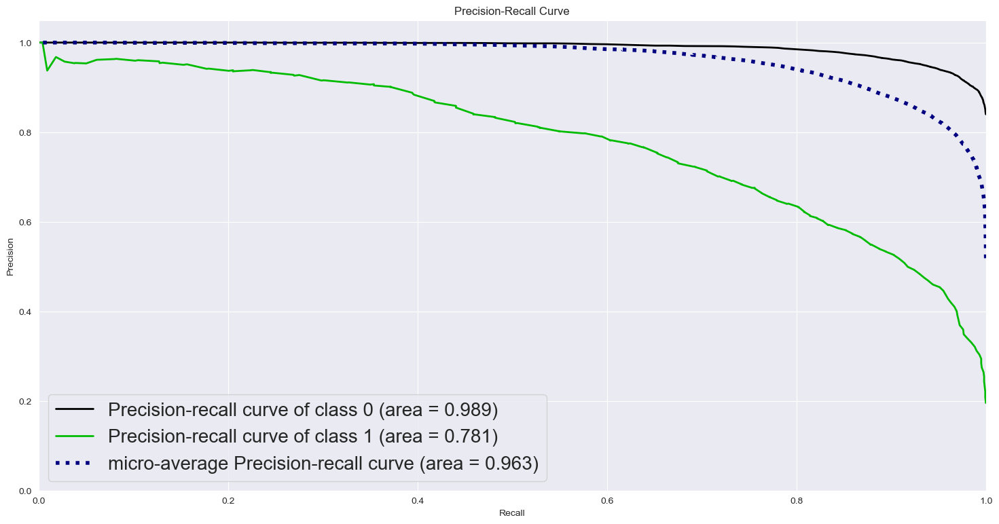

In [300]:
unsampled_data_prediction_RF=rf_pipe.predict_proba(original_df_with_pcs[X_features])
skplt.metrics.plot_precision_recall(original_df_with_pcs['Attrition_Flag'],unsampled_data_prediction_RF)
plt.legend(prop={'size':20})
plt.show()

In [301]:
import plotly.figure_factory as ff
from sklearn.metrics import confusion_matrix
# Extract the true negatives, false positives, false negatives, and true positives
tn, fp, fn, tp = z.ravel()
# Calculate accuracy
accuracy = (tp + tn) / (tp + tn + fp + fn)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 88.75%
